<a href="https://colab.research.google.com/github/sajjad-shirazy/python-notebooks/blob/master/landing_page_gan_ipynb2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# mounting google drive into this VM
from google.colab import drive
drive.mount('/content/gdrive')
print('mounted ...');

# unzipping the target
import zipfile

zip_ref = zipfile.ZipFile('/content/gdrive/My Drive/ML/1000-landing-pages.zip', 'r')
zip_ref.extractall('/data/1000-landing-pages')
zip_ref.close();
print('unzipped ...');
print('done');

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive
mounted ...
unzipped ...
done


In [3]:
# check if every thing is ok
!ls /data/1000-landing-pages/ -U | head -4

5aaab1bcd2b97.jpg
5ccaf46147af7836379561.jpg
5c51d7ed24278764470454.jpg
5cc0bfbdb2108156258954.png


In [4]:
!pip install tensorflow-gpu==2.0.0-alpha0

     |████████████████████████████████| 332.1MB 57kB/s 
     |████████████████████████████████| 61kB 23.2MB/s 
     |████████████████████████████████| 3.0MB 34.4MB/s 
     |████████████████████████████████| 419kB 49.2MB/s 


In [5]:
## load modules
import matplotlib.pyplot as plt
import os, time  
import numpy as np 
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array

import tensorflow as tf
# from keras.backend.tensorflow_backend import set_session


# os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID" 
# config = tf.ConfigProto()
# config.gpu_options.per_process_gpu_memory_fraction = 0.95
# config.gpu_options.visible_device_list = "1" 
# set_session(tf.Session(config=config))  

Using TensorFlow backend.


In [6]:
dir_data      = "/data/1000-landing-pages"
Ntrain        = 950
Ntest         = 50
nm_imgs       = np.sort(os.listdir(dir_data))
## name of the jpg files for training set
nm_imgs_train = np.random.choice(nm_imgs[:Ntrain], 10000) 
## name of the jpg files for the testing data
nm_imgs_test  = np.random.choice(nm_imgs[Ntrain:Ntrain + Ntest], 100)
# img_shape     = (160, 90, 3)
img_shape     = (64, 64, 3)

def get_npdata(nm_imgs_train):
    X_train = []
    for i, myid in enumerate(nm_imgs_train):
        image = load_img(dir_data + "/" + myid, target_size=img_shape[:2])
        image = img_to_array(image)/255.0
        X_train.append(image)
    X_train = np.array(X_train)
    return(X_train)

X_train = get_npdata(nm_imgs_train)
print("X_train.shape = {}".format(X_train.shape))

X_test  = get_npdata(nm_imgs_test)
print("X_test.shape = {}".format(X_test.shape))

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:914: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


X_train.shape = (10000, 64, 64, 3)
X_test.shape = (100, 64, 64, 3)


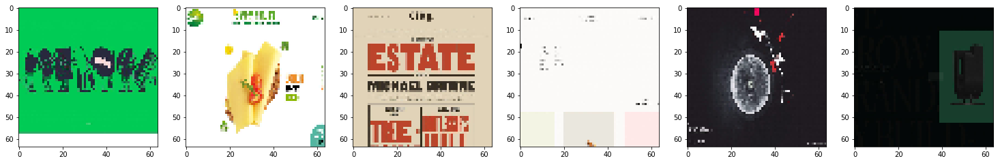

In [7]:
fig = plt.figure(figsize=(30,10))
nplot = 7
for count in range(1,nplot):
    ax = fig.add_subplot(1,nplot,count)
    ax.imshow(X_train[count])
plt.show()

In [8]:
import numpy as np
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam

## optimizer
#optimizer = Adam(0.0002, 0.5)
optimizer = Adam(0.00007, 0.5)

def build_generator(img_shape, noise_shape = (100,)):
    '''
    noise_shape : the dimension of the input vector for the generator
    img_shape   : the dimension of the output
    '''
    ## latent variable as input
    input_noise = layers.Input(shape=noise_shape) 
    d = layers.Dense(1024, activation="relu")(input_noise) 
    d = layers.Dense(1024, activation="relu")(input_noise) 
    d = layers.Dense(128*8*8, activation="relu")(d)
    d = layers.Reshape((8,8,128))(d)
    
    d = layers.Conv2DTranspose(128, kernel_size=(2,2) ,  strides=(2,2) , use_bias=False)(d)
    d = layers.Conv2D( 64  , ( 1 , 1 ) , activation='relu' , padding='same', name="block_4")(d) ## 16,16


    d = layers.Conv2DTranspose(32, kernel_size=(2,2) ,  strides=(2,2) , use_bias=False)(d)
    d = layers.Conv2D( 64  , ( 1 , 1 ) , activation='relu' , padding='same', name="block_5")(d) ## 32,32
    
    if img_shape[0] == 64:
        d = layers.Conv2DTranspose(32, kernel_size=(2,2) ,  strides=(2,2) , use_bias=False)(d)
        d = layers.Conv2D( 64  , ( 1 , 1 ) , activation='relu' , padding='same', name="block_6")(d) ## 64,64
        
    img = layers.Conv2D( 3 , ( 1 , 1 ) , activation='sigmoid' , padding='same', name="final_block")(d) ## 32, 32
    model = models.Model(input_noise, img)
    model.summary() 
    return(model)

## Set the dimension of latent variables to be 100
noise_shape = (100,)

generator = build_generator(img_shape, noise_shape = noise_shape)

generator.compile(loss='binary_crossentropy', optimizer=optimizer)

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              103424    
_________________________________________________________________
dense_2 (Dense)              (None, 8192)              8396800   
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 16, 16, 128)       65536     
_________________________________________________________________
block_4 (Conv2D)             (None, 16, 16, 64)        8256      
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 32, 32, 32)        8192  

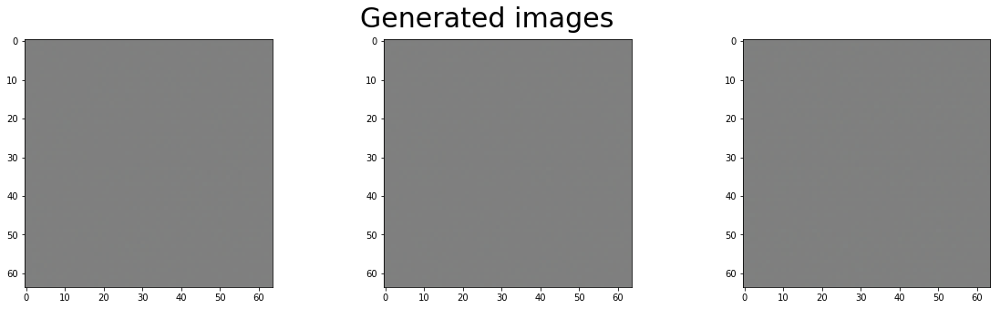

In [9]:
def get_noise(nsample=1, nlatent_dim=100):
    noise = np.random.normal(0, 1, (nsample,nlatent_dim))
    return(noise)

def plot_generated_images(noise,path_save=None,titleadd=""):
    imgs = generator.predict(noise)
    fig = plt.figure(figsize=(20,5))
    for i, img in enumerate(imgs):
        ax = fig.add_subplot(1,nsample,i+1)
        ax.imshow(img)
    fig.suptitle("Generated images "+titleadd,fontsize=30)
    
    if path_save is not None:
        plt.savefig(path_save,
                    bbox_inches='tight',
                    pad_inches=0)
        plt.close()
    else:
        plt.show()

nsample = 3
noise = get_noise(nsample=nsample, nlatent_dim=noise_shape[0])
plot_generated_images(noise)

In [10]:
def build_discriminator(img_shape,noutput=1):
    input_img = layers.Input(shape=img_shape)
    
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv1')(input_img)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
    x = layers.MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)
    
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
    x = layers.MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)
    
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
    x = layers.MaxPooling2D((2, 2), strides=(1, 1), name='block4_pool')(x)

    
    x         = layers.Flatten()(x)
    x         = layers.Dense(1024,      activation="relu")(x)
    out       = layers.Dense(noutput,   activation='sigmoid')(x)
    model     = models.Model(input_img, out)
    
    return model

discriminator  = build_discriminator(img_shape)
discriminator.compile(loss      = 'binary_crossentropy', 
                      optimizer = optimizer,
                      metrics   = ['accuracy'])

discriminator.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 64, 32)        896       
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 64, 32)        9248      
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 32, 32, 32)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 32, 32, 64)        18496     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 32, 32, 64)        36928     
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 16, 16, 64)        0   

In [11]:
z = layers.Input(shape=noise_shape)
img = generator(z)

# For the combined model we will only train the generator
discriminator.trainable = False

# The valid takes generated images as input and determines validity
valid = discriminator(img)

# The combined model  (stacked generator and discriminator) takes
# noise as input => generates images => determines validity 
combined = models.Model(z, valid)
combined.compile(loss='binary_crossentropy', optimizer=optimizer)
combined.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
model (Model)                (None, 64, 64, 3)         8594819   
_________________________________________________________________
model_1 (Model)              (None, 1)                 29780257  
Total params: 38,375,076
Trainable params: 8,594,819
Non-trainable params: 29,780,257
_________________________________________________________________


W0514 06:59:05.200909 140083233126272 training.py:2131] Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
W0514 06:59:05.418571 140083233126272 training.py:2131] Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?


Epoch 00000 [D loss: 0.672, acc.: 050.0%] [G loss: 0.598]


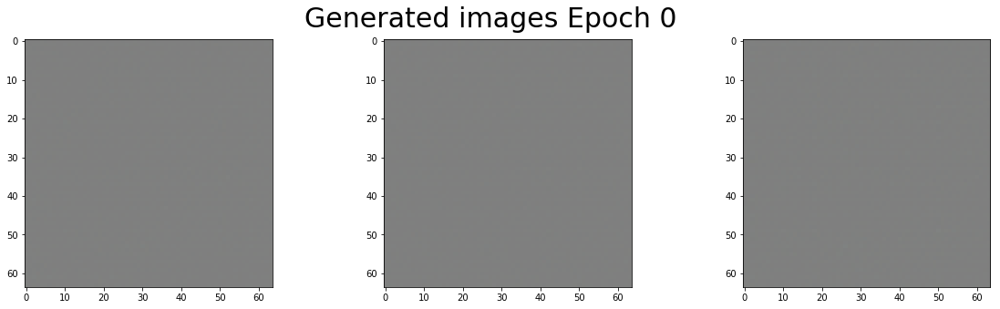

Epoch 00100 [D loss: 0.013, acc.: 099.7%] [G loss: 4.261]
Epoch 00200 [D loss: 0.190, acc.: 092.6%] [G loss: 2.317]
Epoch 00300 [D loss: 0.174, acc.: 093.3%] [G loss: 2.946]
Epoch 00400 [D loss: 0.566, acc.: 074.9%] [G loss: 1.640]
Epoch 00500 [D loss: 0.061, acc.: 098.7%] [G loss: 3.647]
Epoch 00600 [D loss: 0.147, acc.: 095.2%] [G loss: 2.704]
Epoch 00700 [D loss: 0.250, acc.: 093.3%] [G loss: 3.287]
Epoch 00800 [D loss: 0.089, acc.: 097.0%] [G loss: 3.128]
Epoch 00900 [D loss: 0.143, acc.: 094.8%] [G loss: 4.287]
Epoch 01000 [D loss: 0.038, acc.: 099.2%] [G loss: 3.536]


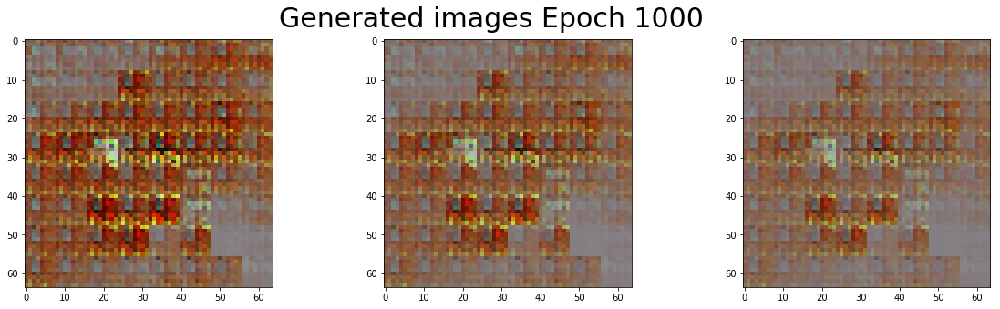

Epoch 01100 [D loss: 0.908, acc.: 077.5%] [G loss: 2.600]
Epoch 01200 [D loss: 0.032, acc.: 099.4%] [G loss: 4.059]
Epoch 01300 [D loss: 0.066, acc.: 097.5%] [G loss: 4.377]
Epoch 01400 [D loss: 0.050, acc.: 098.6%] [G loss: 4.591]
Epoch 01500 [D loss: 0.013, acc.: 099.5%] [G loss: 6.113]
Epoch 01600 [D loss: 0.179, acc.: 096.1%] [G loss: 4.103]
Epoch 01700 [D loss: 0.087, acc.: 097.0%] [G loss: 3.634]
Epoch 01800 [D loss: 0.070, acc.: 098.5%] [G loss: 4.073]
Epoch 01900 [D loss: 0.128, acc.: 095.7%] [G loss: 6.594]
Epoch 02000 [D loss: 0.853, acc.: 079.5%] [G loss: 3.947]


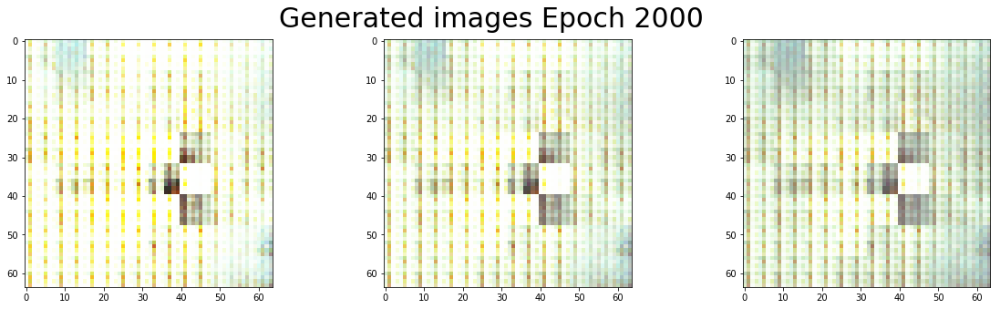

Epoch 02100 [D loss: 0.121, acc.: 096.2%] [G loss: 2.987]
Epoch 02200 [D loss: 0.071, acc.: 098.6%] [G loss: 4.132]
Epoch 02300 [D loss: 0.010, acc.: 099.7%] [G loss: 4.625]
Epoch 02400 [D loss: 0.142, acc.: 097.0%] [G loss: 2.918]
Epoch 02500 [D loss: 0.077, acc.: 097.9%] [G loss: 3.404]
Epoch 02600 [D loss: 0.120, acc.: 096.8%] [G loss: 4.909]
Epoch 02700 [D loss: 0.068, acc.: 098.2%] [G loss: 4.178]
Epoch 02800 [D loss: 0.041, acc.: 098.8%] [G loss: 3.892]
Epoch 02900 [D loss: 0.065, acc.: 098.2%] [G loss: 5.416]
Epoch 03000 [D loss: 0.101, acc.: 096.8%] [G loss: 4.531]


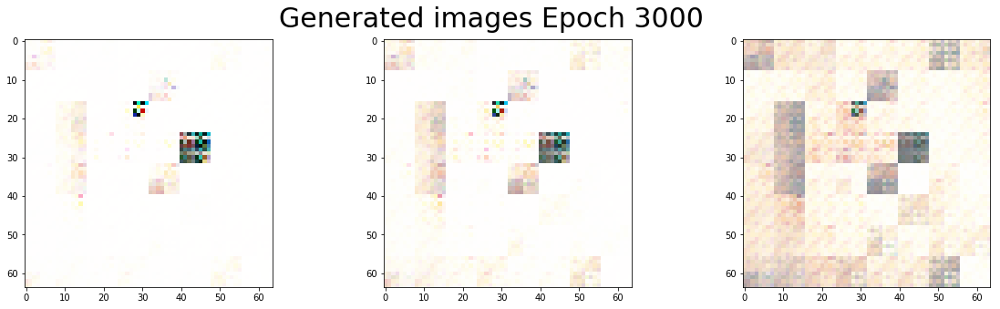

Epoch 03100 [D loss: 0.053, acc.: 098.4%] [G loss: 4.642]
Epoch 03200 [D loss: 0.042, acc.: 098.4%] [G loss: 4.638]
Epoch 03300 [D loss: 0.073, acc.: 098.1%] [G loss: 3.273]
Epoch 03400 [D loss: 0.064, acc.: 098.2%] [G loss: 4.063]
Epoch 03500 [D loss: 0.071, acc.: 098.2%] [G loss: 3.771]
Epoch 03600 [D loss: 0.030, acc.: 099.5%] [G loss: 7.310]
Epoch 03700 [D loss: 0.055, acc.: 098.1%] [G loss: 4.191]
Epoch 03800 [D loss: 0.047, acc.: 097.8%] [G loss: 5.273]
Epoch 03900 [D loss: 0.037, acc.: 098.6%] [G loss: 5.283]
Epoch 04000 [D loss: 0.042, acc.: 099.1%] [G loss: 4.086]


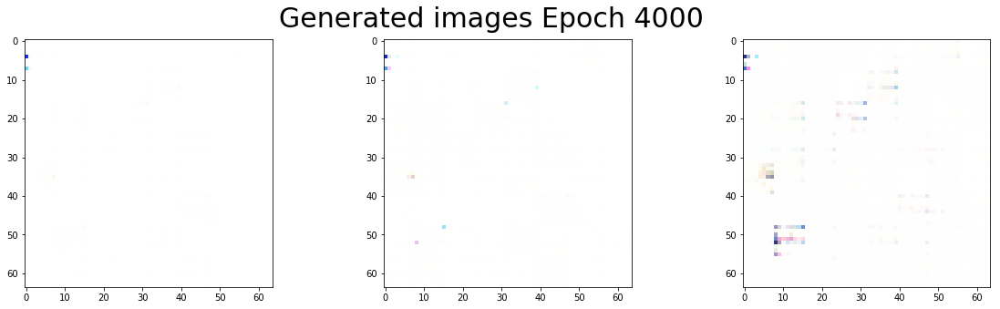

Epoch 04100 [D loss: 0.230, acc.: 092.6%] [G loss: 2.428]
Epoch 04200 [D loss: 0.030, acc.: 099.6%] [G loss: 4.246]
Epoch 04300 [D loss: 0.046, acc.: 099.2%] [G loss: 3.963]
Epoch 04400 [D loss: 0.124, acc.: 096.2%] [G loss: 3.176]
Epoch 04500 [D loss: 0.150, acc.: 096.0%] [G loss: 3.793]
Epoch 04600 [D loss: 0.086, acc.: 097.2%] [G loss: 3.993]
Epoch 04700 [D loss: 0.130, acc.: 096.7%] [G loss: 6.177]
Epoch 04800 [D loss: 0.036, acc.: 098.6%] [G loss: 4.155]
Epoch 04900 [D loss: 0.031, acc.: 099.1%] [G loss: 5.164]
Epoch 05000 [D loss: 0.108, acc.: 096.5%] [G loss: 3.869]


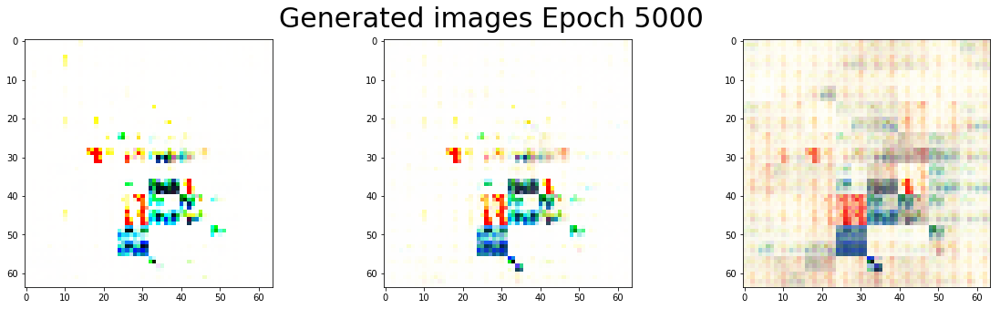

Epoch 05100 [D loss: 0.074, acc.: 097.8%] [G loss: 4.242]
Epoch 05200 [D loss: 0.151, acc.: 095.5%] [G loss: 3.548]
Epoch 05300 [D loss: 0.100, acc.: 096.5%] [G loss: 3.814]
Epoch 05400 [D loss: 0.091, acc.: 097.7%] [G loss: 5.124]
Epoch 05500 [D loss: 0.089, acc.: 096.8%] [G loss: 4.323]
Epoch 05600 [D loss: 0.018, acc.: 099.5%] [G loss: 5.220]
Epoch 05700 [D loss: 0.148, acc.: 094.6%] [G loss: 3.071]
Epoch 05800 [D loss: 0.069, acc.: 098.0%] [G loss: 5.545]
Epoch 05900 [D loss: 0.052, acc.: 098.7%] [G loss: 5.057]
Epoch 06000 [D loss: 0.022, acc.: 099.6%] [G loss: 5.126]


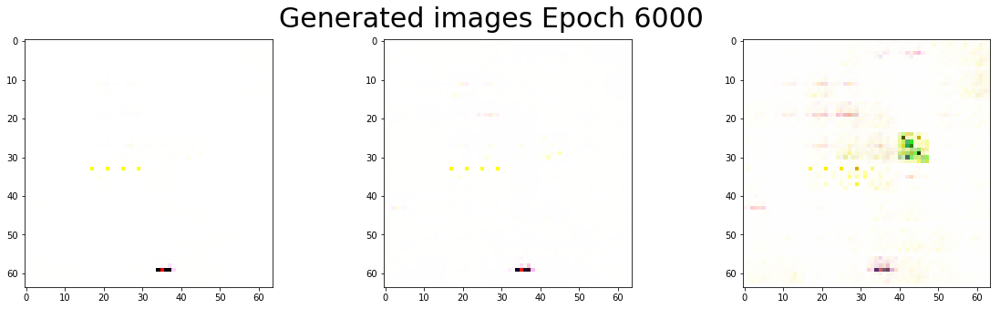

Epoch 06100 [D loss: 0.058, acc.: 098.6%] [G loss: 4.348]
Epoch 06200 [D loss: 0.021, acc.: 099.4%] [G loss: 5.124]
Epoch 06300 [D loss: 0.031, acc.: 099.1%] [G loss: 4.990]
Epoch 06400 [D loss: 0.070, acc.: 097.4%] [G loss: 3.409]
Epoch 06500 [D loss: 0.050, acc.: 098.4%] [G loss: 4.432]
Epoch 06600 [D loss: 0.027, acc.: 099.2%] [G loss: 5.880]
Epoch 06700 [D loss: 0.011, acc.: 099.6%] [G loss: 6.492]
Epoch 06800 [D loss: 0.073, acc.: 098.3%] [G loss: 3.358]
Epoch 06900 [D loss: 0.047, acc.: 098.5%] [G loss: 4.987]
Epoch 07000 [D loss: 0.061, acc.: 098.1%] [G loss: 3.797]


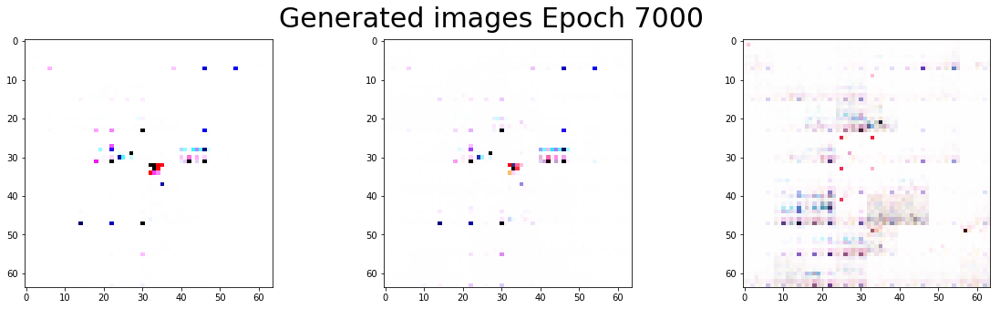

Epoch 07100 [D loss: 0.053, acc.: 098.3%] [G loss: 5.203]
Epoch 07200 [D loss: 0.015, acc.: 099.7%] [G loss: 6.019]
Epoch 07300 [D loss: 0.106, acc.: 096.5%] [G loss: 3.107]
Epoch 07400 [D loss: 0.061, acc.: 097.9%] [G loss: 4.735]
Epoch 07500 [D loss: 0.133, acc.: 095.8%] [G loss: 4.506]
Epoch 07600 [D loss: 0.043, acc.: 098.8%] [G loss: 5.314]
Epoch 07700 [D loss: 0.059, acc.: 097.8%] [G loss: 3.993]
Epoch 07800 [D loss: 0.017, acc.: 099.7%] [G loss: 5.438]
Epoch 07900 [D loss: 0.090, acc.: 097.3%] [G loss: 3.159]
Epoch 08000 [D loss: 0.077, acc.: 097.6%] [G loss: 4.367]


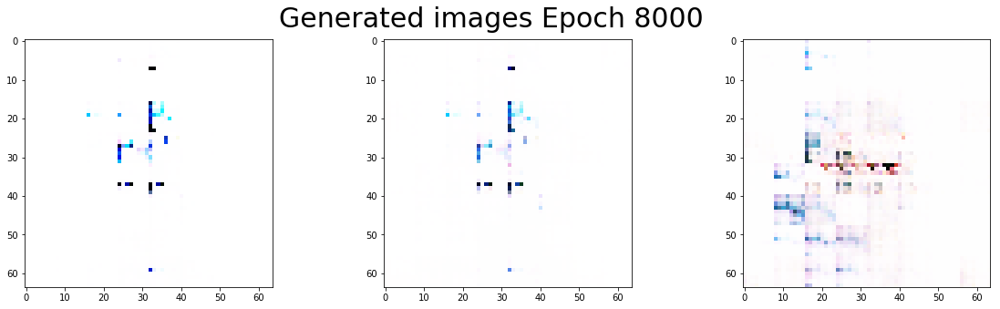

Epoch 08100 [D loss: 0.069, acc.: 097.9%] [G loss: 5.551]
Epoch 08200 [D loss: 0.067, acc.: 098.9%] [G loss: 6.284]
Epoch 08300 [D loss: 0.291, acc.: 088.1%] [G loss: 2.660]
Epoch 08400 [D loss: 0.187, acc.: 092.5%] [G loss: 2.951]
Epoch 08500 [D loss: 0.139, acc.: 095.7%] [G loss: 3.137]
Epoch 08600 [D loss: 0.073, acc.: 097.9%] [G loss: 3.894]
Epoch 08700 [D loss: 0.128, acc.: 096.2%] [G loss: 3.581]
Epoch 08800 [D loss: 0.080, acc.: 097.8%] [G loss: 4.223]
Epoch 08900 [D loss: 0.081, acc.: 098.0%] [G loss: 5.680]
Epoch 09000 [D loss: 0.057, acc.: 098.4%] [G loss: 4.126]


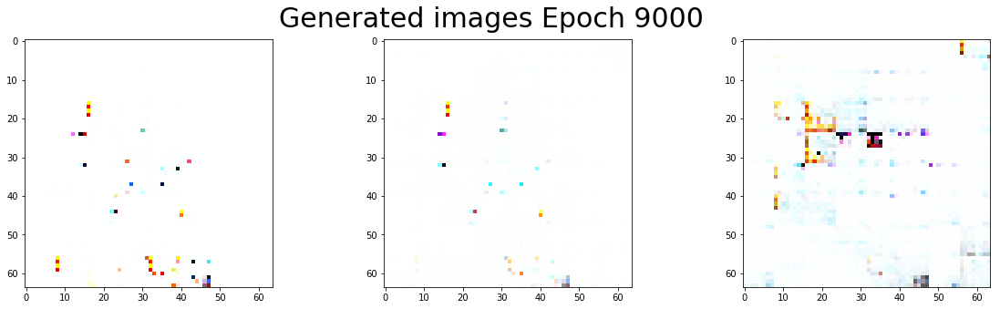

Epoch 09100 [D loss: 0.044, acc.: 098.8%] [G loss: 4.718]
Epoch 09200 [D loss: 0.134, acc.: 095.3%] [G loss: 4.664]
Epoch 09300 [D loss: 0.062, acc.: 098.3%] [G loss: 4.727]
Epoch 09400 [D loss: 0.032, acc.: 099.1%] [G loss: 5.266]
Epoch 09500 [D loss: 0.035, acc.: 099.2%] [G loss: 4.897]
Epoch 09600 [D loss: 0.059, acc.: 098.4%] [G loss: 5.530]
Epoch 09700 [D loss: 0.021, acc.: 099.5%] [G loss: 5.534]
Epoch 09800 [D loss: 0.033, acc.: 098.9%] [G loss: 5.306]
Epoch 09900 [D loss: 0.080, acc.: 097.5%] [G loss: 3.794]
Epoch 10000 [D loss: 0.030, acc.: 099.3%] [G loss: 4.979]


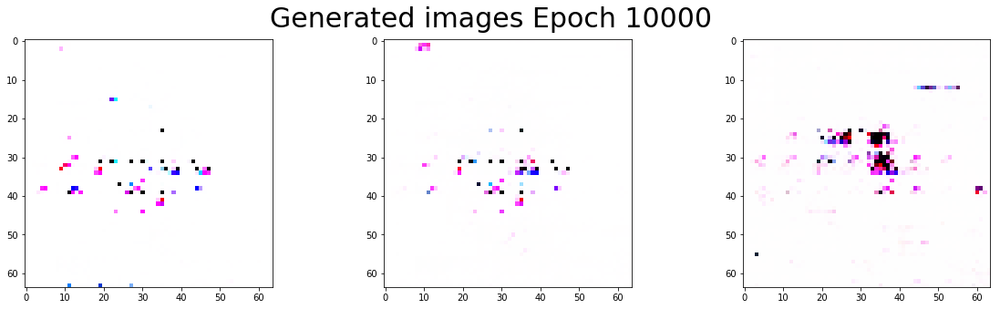

Epoch 10100 [D loss: 0.023, acc.: 099.5%] [G loss: 5.432]
Epoch 10200 [D loss: 0.041, acc.: 098.2%] [G loss: 5.893]
Epoch 10300 [D loss: 0.022, acc.: 099.4%] [G loss: 5.784]
Epoch 10400 [D loss: 0.352, acc.: 088.0%] [G loss: 2.734]
Epoch 10500 [D loss: 0.086, acc.: 096.8%] [G loss: 3.165]
Epoch 10600 [D loss: 0.050, acc.: 098.8%] [G loss: 3.900]
Epoch 10700 [D loss: 0.067, acc.: 098.1%] [G loss: 4.797]
Epoch 10800 [D loss: 0.050, acc.: 099.0%] [G loss: 6.017]
Epoch 10900 [D loss: 0.032, acc.: 098.8%] [G loss: 6.195]
Epoch 11000 [D loss: 0.006, acc.: 100.0%] [G loss: 6.109]


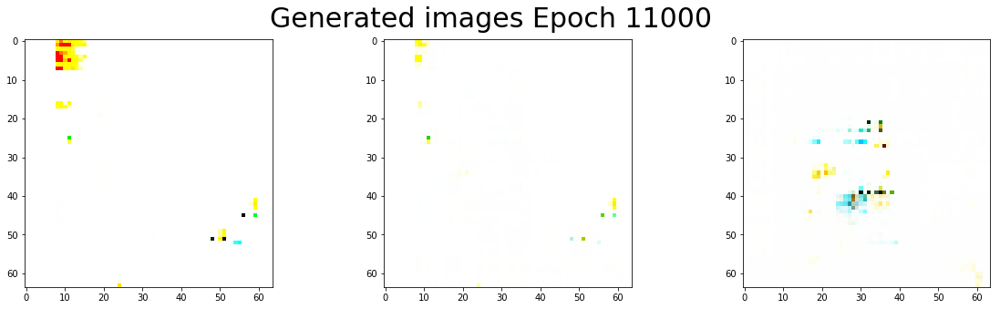

Epoch 11100 [D loss: 0.013, acc.: 099.6%] [G loss: 6.053]
Epoch 11200 [D loss: 0.021, acc.: 099.4%] [G loss: 4.611]
Epoch 11300 [D loss: 0.014, acc.: 099.7%] [G loss: 6.951]
Epoch 11400 [D loss: 0.019, acc.: 099.4%] [G loss: 4.828]
Epoch 11500 [D loss: 0.008, acc.: 099.7%] [G loss: 6.067]
Epoch 11600 [D loss: 0.003, acc.: 100.0%] [G loss: 6.864]
Epoch 11700 [D loss: 0.079, acc.: 097.7%] [G loss: 3.417]
Epoch 11800 [D loss: 0.114, acc.: 096.3%] [G loss: 3.437]
Epoch 11900 [D loss: 0.166, acc.: 094.4%] [G loss: 4.063]
Epoch 12000 [D loss: 0.052, acc.: 098.3%] [G loss: 4.812]


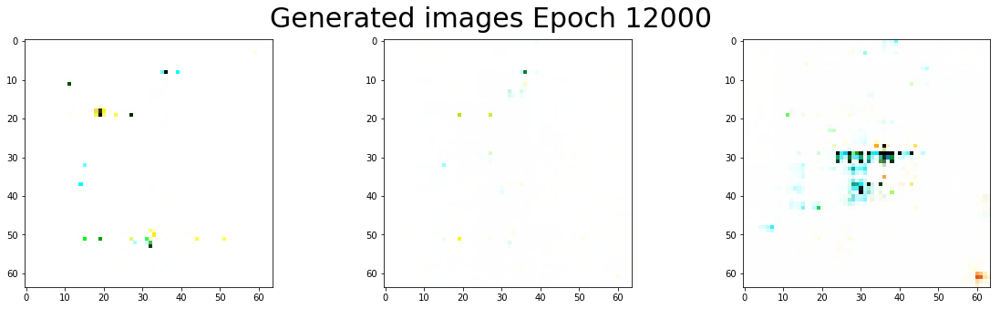

Epoch 12100 [D loss: 0.024, acc.: 099.3%] [G loss: 6.150]
Epoch 12200 [D loss: 0.020, acc.: 099.5%] [G loss: 5.477]
Epoch 12300 [D loss: 0.020, acc.: 099.5%] [G loss: 6.402]
Epoch 12400 [D loss: 0.005, acc.: 100.0%] [G loss: 7.007]
Epoch 12500 [D loss: 0.003, acc.: 099.9%] [G loss: 7.392]
Epoch 12600 [D loss: 0.009, acc.: 099.9%] [G loss: 7.969]
Epoch 12700 [D loss: 0.063, acc.: 098.5%] [G loss: 4.415]
Epoch 12800 [D loss: 0.027, acc.: 099.1%] [G loss: 5.218]
Epoch 12900 [D loss: 0.007, acc.: 099.9%] [G loss: 6.327]
Epoch 13000 [D loss: 0.049, acc.: 098.5%] [G loss: 4.200]


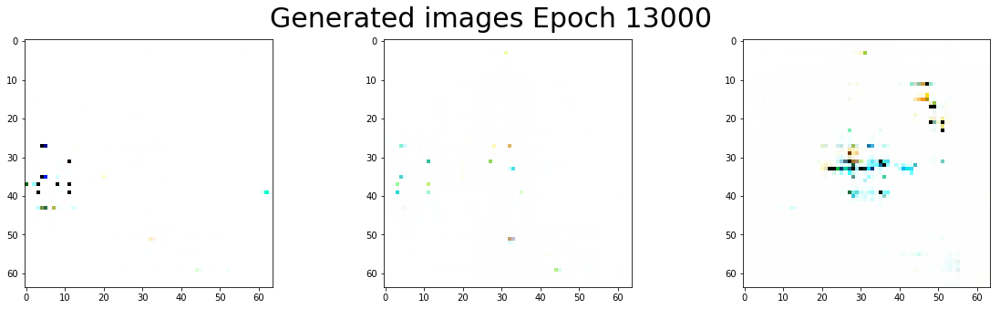

Epoch 13100 [D loss: 0.028, acc.: 099.0%] [G loss: 5.356]
Epoch 13200 [D loss: 0.010, acc.: 099.8%] [G loss: 5.832]
Epoch 13300 [D loss: 0.011, acc.: 099.8%] [G loss: 6.961]
Epoch 13400 [D loss: 0.042, acc.: 098.5%] [G loss: 4.833]
Epoch 13500 [D loss: 0.017, acc.: 099.7%] [G loss: 6.145]
Epoch 13600 [D loss: 0.011, acc.: 099.7%] [G loss: 7.045]
Epoch 13700 [D loss: 0.040, acc.: 098.3%] [G loss: 6.181]
Epoch 13800 [D loss: 0.018, acc.: 099.5%] [G loss: 5.912]
Epoch 13900 [D loss: 0.006, acc.: 099.9%] [G loss: 6.938]
Epoch 14000 [D loss: 0.015, acc.: 099.4%] [G loss: 7.921]


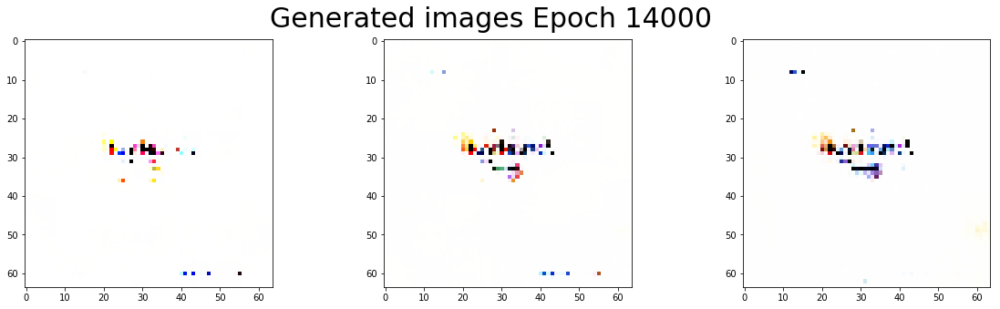

Epoch 14100 [D loss: 0.152, acc.: 094.9%] [G loss: 3.965]
Epoch 14200 [D loss: 0.055, acc.: 098.5%] [G loss: 4.813]
Epoch 14300 [D loss: 0.020, acc.: 099.2%] [G loss: 5.674]
Epoch 14400 [D loss: 0.018, acc.: 099.7%] [G loss: 6.165]
Epoch 14500 [D loss: 0.009, acc.: 099.9%] [G loss: 5.975]
Epoch 14600 [D loss: 0.020, acc.: 099.5%] [G loss: 6.244]
Epoch 14700 [D loss: 0.005, acc.: 099.9%] [G loss: 7.627]
Epoch 14800 [D loss: 0.033, acc.: 099.3%] [G loss: 5.252]
Epoch 14900 [D loss: 0.007, acc.: 099.9%] [G loss: 6.664]
Epoch 15000 [D loss: 0.004, acc.: 099.9%] [G loss: 7.638]


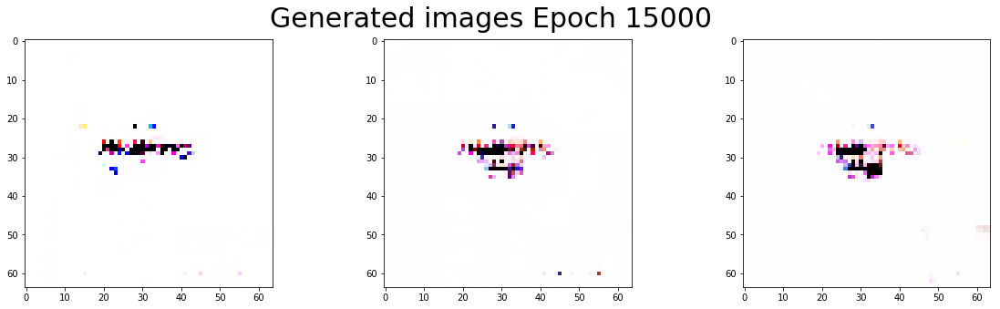

Epoch 15100 [D loss: 0.027, acc.: 099.0%] [G loss: 4.826]
Epoch 15200 [D loss: 0.011, acc.: 099.6%] [G loss: 6.417]
Epoch 15300 [D loss: 0.003, acc.: 100.0%] [G loss: 7.366]
Epoch 15400 [D loss: 0.005, acc.: 099.9%] [G loss: 8.132]
Epoch 15500 [D loss: 0.539, acc.: 088.9%] [G loss: 4.153]
Epoch 15600 [D loss: 0.025, acc.: 099.4%] [G loss: 4.658]
Epoch 15700 [D loss: 0.008, acc.: 100.0%] [G loss: 5.900]
Epoch 15800 [D loss: 0.005, acc.: 099.9%] [G loss: 6.874]
Epoch 15900 [D loss: 0.006, acc.: 100.0%] [G loss: 7.108]
Epoch 16000 [D loss: 0.006, acc.: 099.8%] [G loss: 7.324]


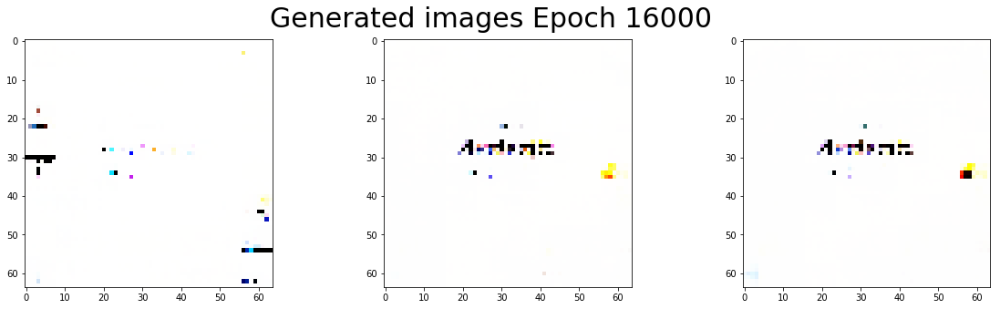

Epoch 16100 [D loss: 0.004, acc.: 100.0%] [G loss: 7.576]
Epoch 16200 [D loss: 0.002, acc.: 100.0%] [G loss: 8.294]
Epoch 16300 [D loss: 0.001, acc.: 100.0%] [G loss: 8.423]
Epoch 16400 [D loss: 0.030, acc.: 099.2%] [G loss: 5.479]
Epoch 16500 [D loss: 0.006, acc.: 099.8%] [G loss: 6.488]
Epoch 16600 [D loss: 0.013, acc.: 099.9%] [G loss: 6.796]
Epoch 16700 [D loss: 0.001, acc.: 100.0%] [G loss: 8.108]
Epoch 16800 [D loss: 0.003, acc.: 099.9%] [G loss: 7.394]
Epoch 16900 [D loss: 0.081, acc.: 096.4%] [G loss: 5.087]
Epoch 17000 [D loss: 0.025, acc.: 099.3%] [G loss: 5.017]


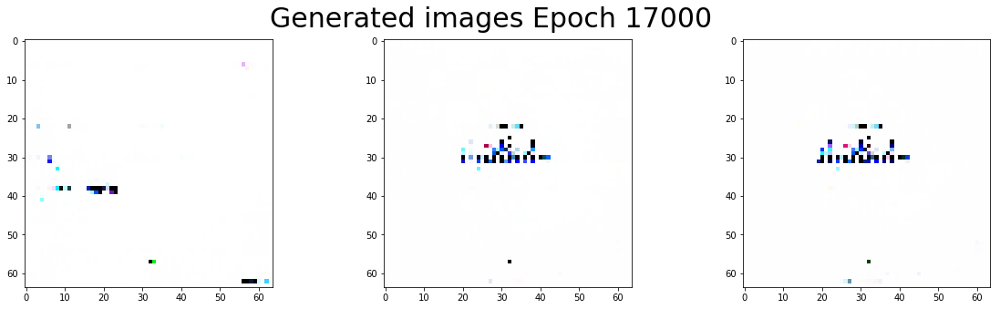

Epoch 17100 [D loss: 0.022, acc.: 099.5%] [G loss: 6.038]
Epoch 17200 [D loss: 0.011, acc.: 099.7%] [G loss: 6.462]
Epoch 17300 [D loss: 0.021, acc.: 099.6%] [G loss: 6.049]
Epoch 17400 [D loss: 0.077, acc.: 097.4%] [G loss: 5.075]
Epoch 17500 [D loss: 0.038, acc.: 099.0%] [G loss: 6.288]
Epoch 17600 [D loss: 0.111, acc.: 096.5%] [G loss: 10.619]
Epoch 17700 [D loss: 0.023, acc.: 099.6%] [G loss: 5.368]
Epoch 17800 [D loss: 0.017, acc.: 099.6%] [G loss: 7.056]
Epoch 17900 [D loss: 0.017, acc.: 099.6%] [G loss: 7.334]
Epoch 18000 [D loss: 0.030, acc.: 099.4%] [G loss: 4.914]


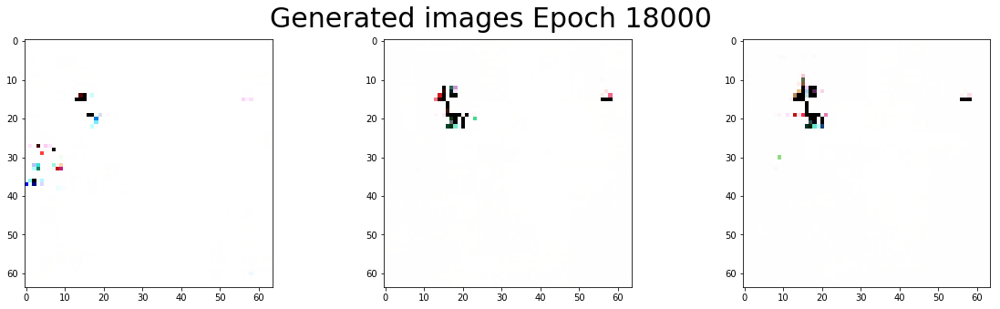

Epoch 18100 [D loss: 0.041, acc.: 098.9%] [G loss: 5.840]
Epoch 18200 [D loss: 0.018, acc.: 099.7%] [G loss: 5.810]
Epoch 18300 [D loss: 0.044, acc.: 098.4%] [G loss: 7.038]
Epoch 18400 [D loss: 0.010, acc.: 099.8%] [G loss: 8.652]
Epoch 18500 [D loss: 0.043, acc.: 098.6%] [G loss: 5.515]
Epoch 18600 [D loss: 0.017, acc.: 099.5%] [G loss: 6.810]
Epoch 18700 [D loss: 0.010, acc.: 099.8%] [G loss: 7.960]
Epoch 18800 [D loss: 0.011, acc.: 099.9%] [G loss: 8.148]
Epoch 18900 [D loss: 0.038, acc.: 098.9%] [G loss: 4.714]
Epoch 19000 [D loss: 0.023, acc.: 099.2%] [G loss: 5.886]


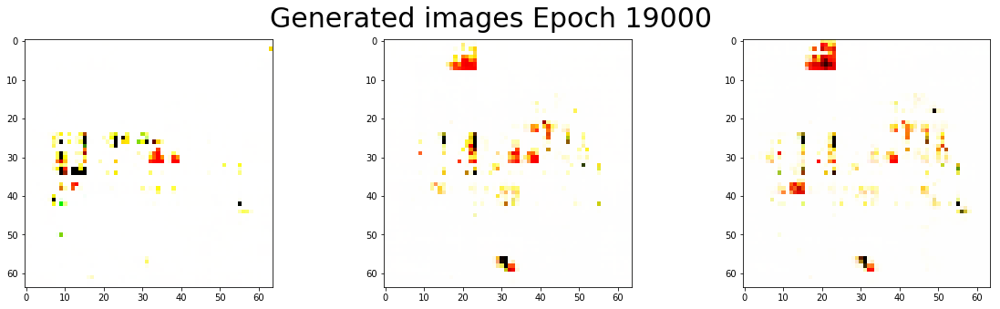

Epoch 19100 [D loss: 0.028, acc.: 099.2%] [G loss: 6.942]
Epoch 19200 [D loss: 0.021, acc.: 099.6%] [G loss: 6.290]
Epoch 19300 [D loss: 0.009, acc.: 100.0%] [G loss: 6.529]
Epoch 19400 [D loss: 0.007, acc.: 100.0%] [G loss: 7.307]
Epoch 19500 [D loss: 0.085, acc.: 097.2%] [G loss: 3.973]
Epoch 19600 [D loss: 0.042, acc.: 098.9%] [G loss: 5.138]
Epoch 19700 [D loss: 0.026, acc.: 099.7%] [G loss: 5.696]
Epoch 19800 [D loss: 0.087, acc.: 096.6%] [G loss: 4.542]
Epoch 19900 [D loss: 0.046, acc.: 098.3%] [G loss: 5.353]
----------
Time took: 303.83 min


In [13]:
def train(models, X_train, noise_plot, dir_result="/result/", epochs=10000, batch_size=128):
        '''
        models     : tuple containins three tensors, (combined, discriminator, generator)
        X_train    : np.array containing images (Nsample, height, width, Nchannels)
        noise_plot : np.array of size (Nrandom_sample_to_plot, hidden unit length)
        dir_result : the location where the generated plots for noise_plot are saved 
        
        '''
        combined, discriminator, generator = models
        nlatent_dim = noise_plot.shape[1]
        half_batch  = int(batch_size / 2)
        history = []
        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random half batch of images
            idx = np.random.randint(0, X_train.shape[0], half_batch)
            imgs = X_train[idx]
            noise = get_noise(half_batch, nlatent_dim)

            # Generate a half batch of new images
            gen_imgs = generator.predict(noise)

            
            # Train the discriminator q: better to mix them together?
            d_loss_real = discriminator.train_on_batch(imgs, np.ones((half_batch, 1)))
            d_loss_fake = discriminator.train_on_batch(gen_imgs, np.zeros((half_batch, 1)))
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)


            # ---------------------
            #  Train Generator
            # ---------------------

            noise = get_noise(batch_size, nlatent_dim)

            # The generator wants the discriminator to label the generated samples
            # as valid (ones)
            valid_y = (np.array([1] * batch_size)).reshape(batch_size,1)
            
            # Train the generator
            g_loss = combined.train_on_batch(noise, valid_y)

            history.append({"D":d_loss[0],"G":g_loss})
            
            if epoch % 100 == 0:
                # Plot the progress
                print ("Epoch {:05.0f} [D loss: {:4.3f}, acc.: {:05.1f}%] [G loss: {:4.3f}]".format(
                    epoch, d_loss[0], 100*d_loss[1], g_loss))
            if epoch % int(epochs/100) == 0:
                plot_generated_images(noise_plot,
                                      path_save=dir_result+"/image_{:05.0f}.png".format(epoch),
                                      titleadd="Epoch {}".format(epoch))
            if epoch % 1000 == 0:
                plot_generated_images(noise_plot,
                                      titleadd="Epoch {}".format(epoch))
                        
        return(history)

dir_result="./result_GAN/"

try:
    os.mkdir(dir_result)
except:
    pass
    
start_time = time.time()

_models = combined, discriminator, generator          

# history = train(_models, X_train, noise, dir_result=dir_result,epochs=20000, batch_size=128*8)
history = train(_models, X_train, noise, dir_result=dir_result,epochs=20000, batch_size=128*8)
end_time = time.time()
print("-"*10)
print("Time took: {:4.2f} min".format((end_time - start_time)/60))

## Loss over epochs

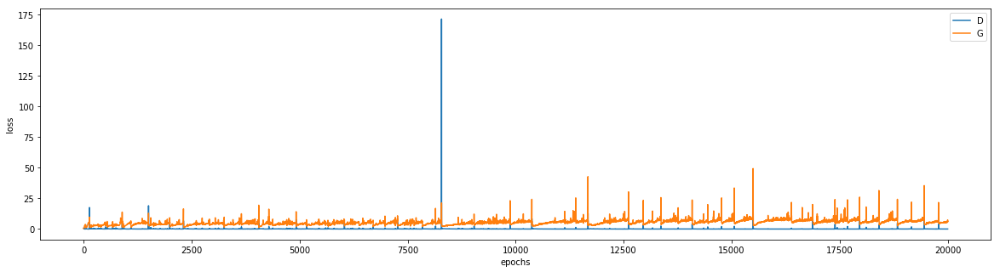

In [14]:
import pandas as pd 
hist = pd.DataFrame(history)
plt.figure(figsize=(20,5))
for colnm in hist.columns:
    plt.plot(hist[colnm],label=colnm)
plt.legend()
plt.ylabel("loss")
plt.xlabel("epochs")
plt.show()

In [0]:
def makegif(dir_images):
    import imageio
    filenames = np.sort(os.listdir(dir_images))
    filenames = [ fnm for fnm in filenames if ".png" in fnm]

    with imageio.get_writer(dir_images + '/image.gif', mode='I') as writer:
        for filename in filenames:
            image = imageio.imread(dir_images + filename)
            writer.append_data(image)
            os.remove(dir_images + filename)
            
makegif(dir_result)

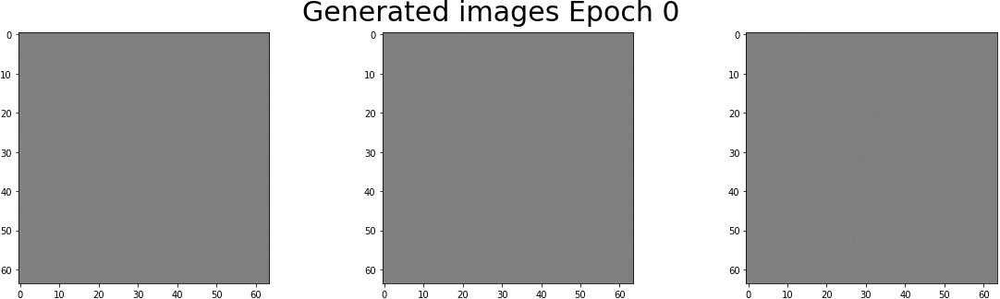

In [16]:
from IPython.display import Image
with open(dir_result + '/image.gif','rb') as f:
    display(Image(data=f.read(), format='png'))